In [1]:
import fwiVis.fwiVis as fv
import s3fs
s3 = s3fs.S3FileSystem(anon=False)
from math import cos, asin, sqrt
import re
import datetime
import numpy as np
import geopandas as gpd
import pandas as pd
from matplotlib import pyplot as plt
import os
import rioxarray as rio
import xarray as xr
import rasterio
import glob
from geocube.api.core import make_geocube
from shapely.errors import ShapelyDeprecationWarning
from shapely.geometry import Point
import warnings
import folium
from folium import plugins
warnings.filterwarnings("ignore", category=ShapelyDeprecationWarning) 

NameError: name 'month_early' is not defined

In [4]:
## Load in the perimeters of the fires
lf_files = s3.glob('s3://veda-data-store-staging/EIS/other/feds-WesternUS/2020/Largefire/F' + '5119' + '_*') 
fire = gpd.read_file("s3://" + lf_files[-1],layer='perimeter')
fire = fire.to_crs('EPSG:4326')
fire.t = fire.t.astype("str")
fire.explore(color = "purple", style_kwds={'fillOpacity': 0})


In [5]:
imerge_hourly = xr.open_dataset("s3://veda-data-store-staging/EIS/zarr/FWI-GEOS-5-Hourly", engine="zarr")
imerge_hourly.rio.write_crs("epsg:4326", inplace=True)
imerge_hourly.rio.set_spatial_dims(x_dim = "lon", y_dim = "lat", inplace = True)
imerge_hourly

<xarray.Dataset>
Dimensions:      (time: 26880, lat: 533, lon: 1152)
Coordinates:
  * lat          (lat) float64 -58.0 -57.75 -57.5 -57.25 ... 74.5 74.75 75.0
  * lon          (lon) float64 -180.0 -179.7 -179.4 -179.1 ... 179.1 179.4 179.7
  * time         (time) datetime64[ns] 2020-01-01 ... 2023-01-24T23:00:00
    spatial_ref  int64 0
Data variables:
    GEOS-5_FFMC  (time, lat, lon) float32 ...
    GEOS-5_FWI   (time, lat, lon) float32 ...
    GEOS-5_ISI   (time, lat, lon) float32 ...
Attributes: (12/46)
    Center:              NASA GISS / Columbia University
    Center::             center
    DCDryStartFactor:    5.0
    DCDryStartFactor::   DC number of days since precip mult factor for dry s...
    DCStart:             15.0
    DCStart::            DC starting value after wet winter
    ...                  ...
    snowCoverDaysCalc:   60.0
    snowCoverDaysCalc::  Number of days prior to spring over which to determi...
    startShutDays:       2.0
    startShutDays::      Number of previous days over which to consider start...
    tempThresh:          6.0
    tempThresh::         Temp thresh (C) to define start and end of winter

In [6]:
# Get the final perimeter of the fire
final_perimeter = max(fire[fire.t == max(fire.t)].geometry)
start_date =  min(fire.t.astype("datetime64[ns]"))
month_early = start_date - np.timedelta64(1, 'M')
lons = final_perimeter.envelope.exterior.coords.xy[0]
lats = final_perimeter.envelope.exterior.coords.xy[1]

# Clip the FWI raster to the area of the fire
img_clip_h = imerge_hourly.rio.clip_box(minx = min(lons), miny = min(lats), maxx=max(lons), maxy = max(lats), 
                                        auto_expand= True)
img_clip_h = img_clip_h.sel(time = slice(month_early, max(fire.t))).mean(dim = ["lat", "lon"])
img_clip_h = img_clip_h.to_dataframe()
img_clip_h.drop(columns = "spatial_ref", inplace = True)
fire = fire.rename(columns = {"t" : "time"})
fire['time'] = fire['time'].astype('datetime64[ns]')

# Merge the fire timeseries with the FWI timeseries
full = pd.merge(fire,img_clip_h, on = "time", how = "outer")
full = full.sort_values(by = ["time"])

Text(0, 0.5, 'Fire Weather Index')

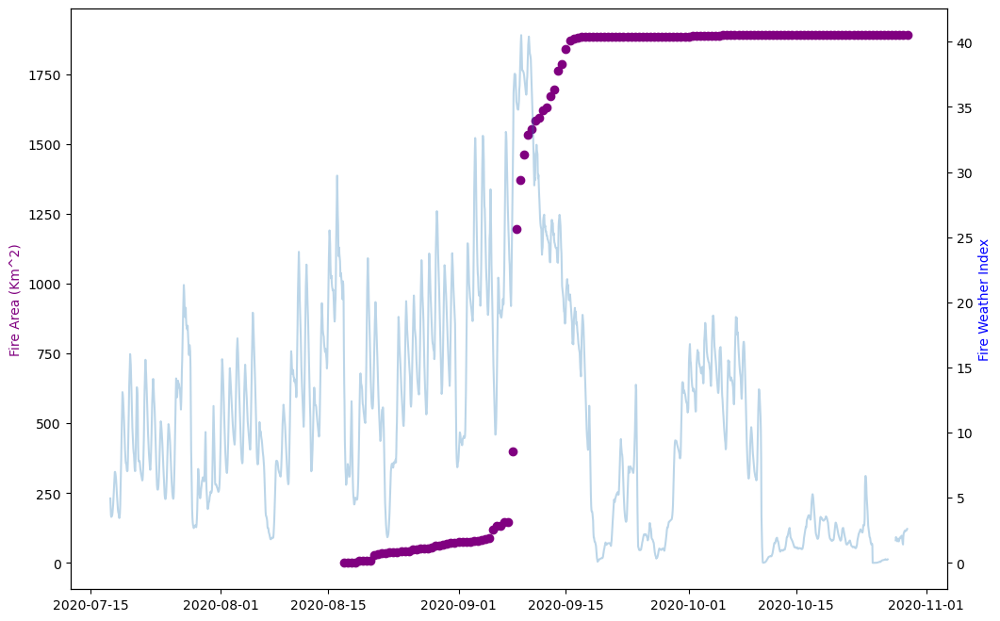

In [7]:
# Plot
fig, ax = plt.subplots(figsize=(12,8))
ax.scatter(full.time, full.farea, color = "purple")
ax.set_ylabel("Fire Area (Km^2)", color = "purple")
ax2=ax.twinx()
ax2.plot(full.time, full["GEOS-5_FWI"], alpha = 0.3)

ax2.set_ylabel("Fire Weather Index",color="blue")

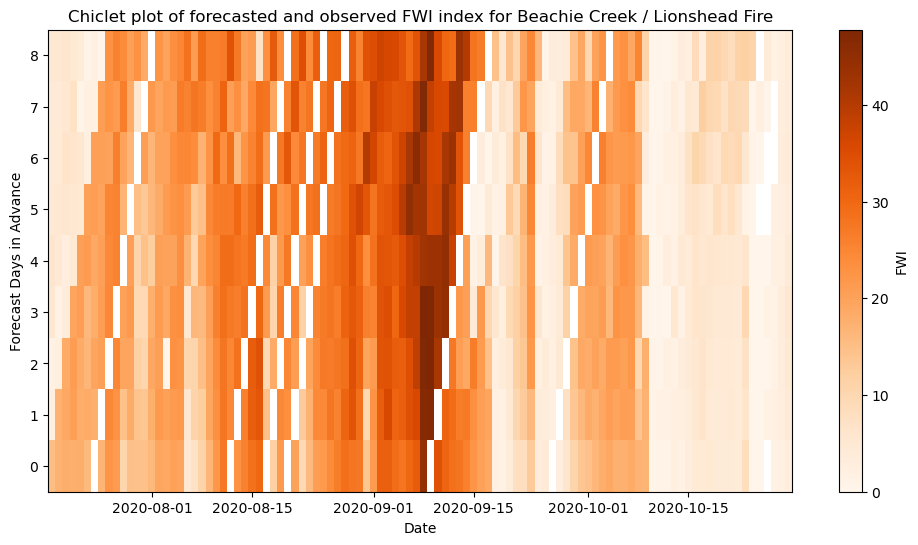

In [10]:
# Open up forecasted FWI
FWI_forecast = xr.open_zarr("s3://veda-data-store-staging/EIS/zarr/FWI.GEOS-5.zarr")
FWI_forecast = FWI_forecast.rename({"lat": 'y', "lon": 'x'})
FWI_forecast.rio.write_crs("epsg:4326", inplace=True)

# Clip to the variable, time, and location we are interested in. 
FWI_forecast = FWI_forecast["GEOS-5_FWI"]
FWI_forecast = FWI_forecast.sel(time = slice(month_early, max(fire.time)))
FWI_forecast = FWI_forecast.rio.clip_box(minx = min(lons), miny = min(lats), maxx=max(lons), maxy = max(lats), auto_expand= True)
FWI_forecast = FWI_forecast.mean(dim = ["y", "x"])
# Diagonally shiftting the data for chiclet plot
tmp = np.array([np.roll(np.array(FWI_forecast.sel(forecast=i).values), i) for i in range(9)])
ys = np.arange(9)
xs = FWI_forecast.time.values
zs = tmp
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Chiclet plot of forecasted and observed FWI index for Beachie Creek / Lionshead Fire")
plt.pcolormesh(xs,ys,tmp, cmap="Oranges")
plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "FWI")
plt.show()

In [199]:
## Read in Robert's csv

skalimantan = pd.read_csv("https://portal.nccs.nasa.gov/datashare/ACMAP/TropicalRectanglesIndo/CFSv2/MERRA2.CPC/3.nZones/2012010100.2023123100.nFireSeasonMonths.4.smooth.1.day/chiclets/2.FWI.DC.SouthernKalimantan.Indonesia.raw.chiclet.csv")


In [14]:
skalimantan.columns

Index(['INITDATE', '0', '1', '2', '3', '4', '5', '6', '7', '8',
       ...
       '141', '142', '143', '144', '145', '146', '147', '148', '149', '150'],
      dtype='object', length=152)

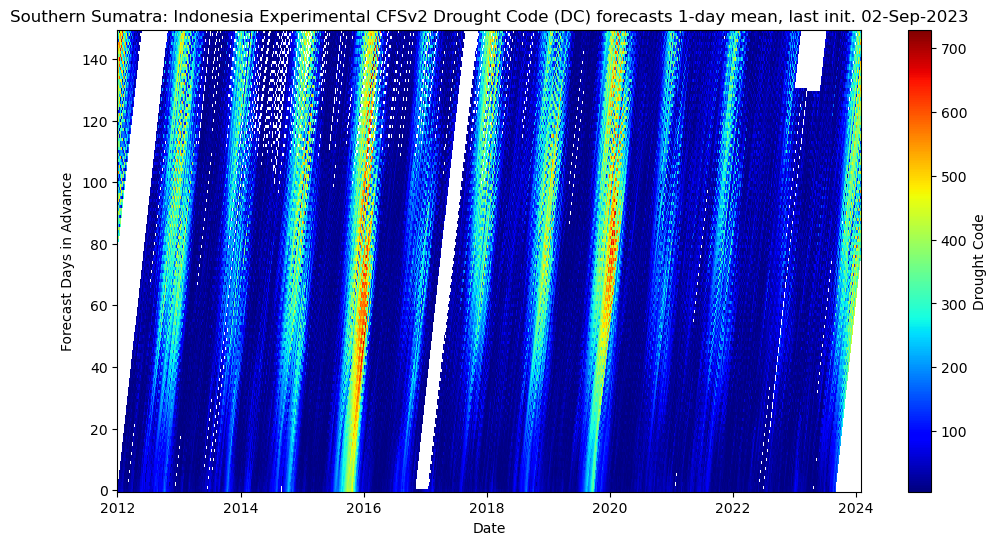

In [30]:

tmp = np.array([np.roll(np.array(skalimantan[str(i)].values), i) for i in range(150)])
ys = np.arange(150)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
xs = skalimantan.time.values
zs = tmp
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
plt.pcolormesh(xs,ys,tmp, cmap="jet")
plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "Drought Code")
plt.show()

In [33]:
skalimantan['1'].rank()

0          NaN
1       1713.0
2       1405.0
3       2012.0
4       2330.0
         ...  
4411       NaN
4412       NaN
4413       NaN
4414       NaN
4415       NaN
Name: 1, Length: 4416, dtype: float64

In [137]:
### yearly rank just pulls out seasonal cycle. need to group by month/day

tmp = np.array([np.roll(np.array(skalimantan[str(i)].rank()/len(skalimantan[str(i)])), i) for i in range(150)])
ys = np.arange(150)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
xs = skalimantan.time.values
zs = tmp
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
plt.pcolormesh(xs,ys,tmp, cmap="jet") # "jet"
plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "Drought Code Rank")
plt.show()

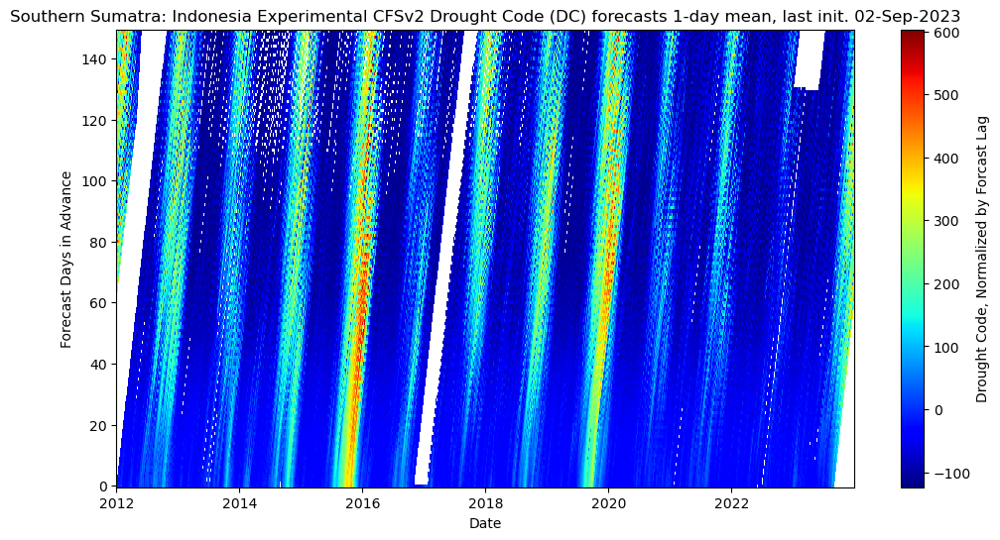

In [194]:
tmp = np.array([np.roll(np.array(skalimantan[str(i)]-skalimantan[str(i)].mean()), i) for i in range(150)])
ys = np.arange(150)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
xs = skalimantan.time.values
zs = tmp
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
plt.pcolormesh(xs,ys,tmp, cmap="jet") # "jet"
plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "Drought Code, Normalized by Forcast Lag")
plt.show()

In [180]:
### yearly rank just pulls out seasonal cycle. need to group by month/day
print(skalimantan['0'].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).rank())
#print(len(skalimantan['0']))



tmp = [np.roll(np.array(skalimantan[str(i)].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).rank()), i) for i in range(150)]
tmp = np.array(tmp)
              
ys = np.arange(150)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
xs = skalimantan.time.values
zs = tmp
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
plt.pcolormesh(xs,ys,tmp, cmap="jet") # "jet"
plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "Drought Code Rank")
plt.show()

In [185]:
### yearly rank just pulls out seasonal cycle. need to group by month/day
print(skalimantan['0'].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).rank())
#print(len(skalimantan['0']))



tmp = [np.roll(np.array(skalimantan[str(i)].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).rank()), i) for i in range(150)]
tmp = np.array(tmp)
              
ys = np.arange(150)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
xs = skalimantan.time.values
zs = tmp
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
plt.pcolormesh(xs,ys,tmp, cmap="jet") # "jet"
plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "Drought Code Rank")
plt.show()

time  time      
1     1     0       NaN
            366     1.0
            731     2.0
            1096    1.0
            1461    2.0
                   ... 
31    12    2921    1.0
            3287    2.0
            3652    1.0
            4017    2.0
            4382    NaN
Name: 0, Length: 4383, dtype: float64


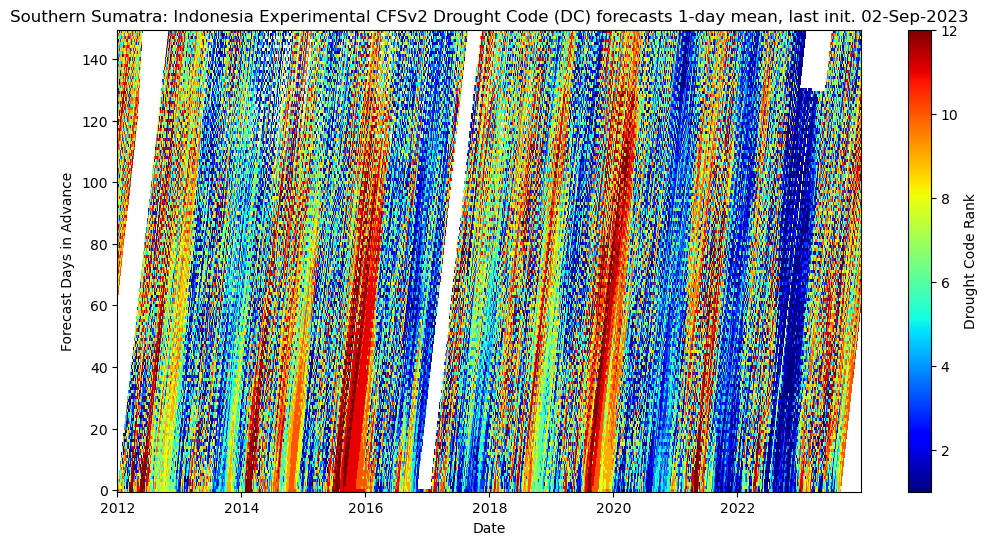

In [236]:
### yearly rank just pulls out seasonal cycle. need to group by month/day
print(skalimantan['0'].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).rolling(2).rank())
#print(len(skalimantan['0']))



tmp = [np.roll(np.array(skalimantan[str(i)].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).rank()), i) for i in range(150)]
tmp = np.array(tmp)
              
ys = np.arange(150)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
xs = skalimantan.time.values
zs = tmp
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
plt.pcolormesh(xs,ys,tmp, cmap="jet") # "jet"
plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "Drought Code Rank")
plt.show()

In [204]:
#tmp = [np.roll(np.array(skalimantan[str(i)].groupby([skalimantan.time.dt.month]).rank()), i) for i in range(150)]
#tmp = np.array(tmp)
              
#ys = np.arange(150)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
# xs = skalimantan.time.values
# zs = tmp
# # Display the Plot
# plt.figure(figsize=(12,6))
# plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
# plt.pcolormesh(xs,ys,tmp, cmap="jet") # "jet"
# plt.xlabel("Date")
# plt.ylabel("Forecast Days in Advance")
# plt.colorbar(label = "Drought Code Rank")
# plt.show()

In [205]:
### yearly rank just pulls out seasonal cycle. need to group by month/day
#print(skalimantan['0'].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).rank())
#print(len(skalimantan['0']))

#skalimantan = skalimantan[skalimantan.time.dt.strftime('%m-%d') != '02-29']
skalimantan = skalimantan[skalimantan.time >= "2012-01-01"]
skalimantan = skalimantan[skalimantan.time <= "2023-12-31"]
print(max(skalimantan.time))

2023-12-31 00:00:00


In [129]:
test = skalimantan[["0"]].set_index([skalimantan.time.dt.day, skalimantan.time.dt.month])

test

,,0
time,time,
1,1,23.857397
2,1,27.372566
3,1,31.706701
4,1,35.594051
5,1,38.903492
...,...,...
27,12,NaN
28,12,NaN
29,12,NaN


In [130]:
test[str(0)]/(skalimantan[str(0)].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).mean())

time  time
1     1       0.686367
      1       0.380395
      1       0.876899
      1       0.761949
      1       1.804500
                ...   
31    12      0.656928
      12      1.198185
      12      0.388117
      12      1.683583
      12           NaN
Name: 0, Length: 4380, dtype: float64

369.92007632689075


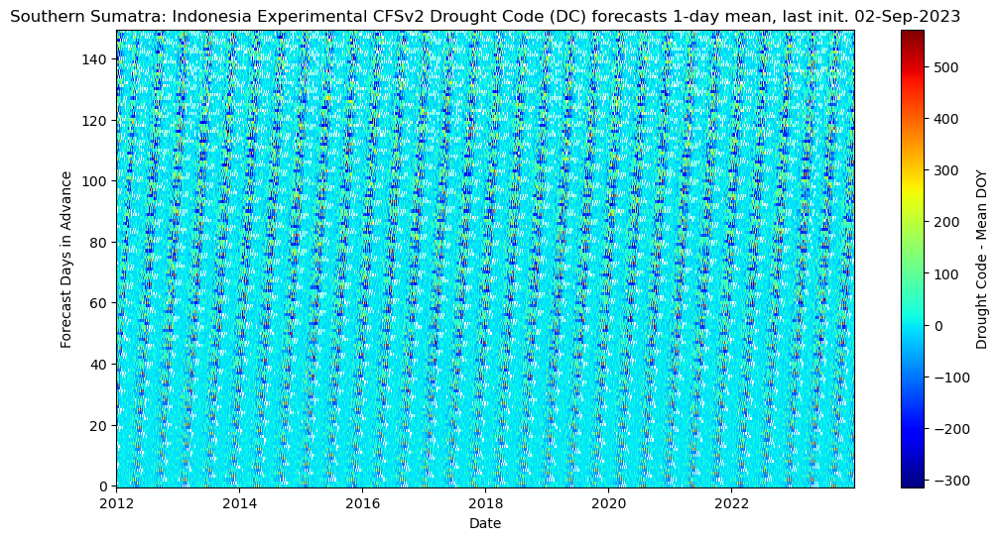

In [235]:
tmp = [np.roll(
    np.array(
    skalimantan[[str(i)]].set_index([skalimantan.time.dt.day, skalimantan.time.dt.month])[str(i)] 
        - (skalimantan[str(i)].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).mean())
), 
    i) for i in range(150)]
tmp = np.array(tmp)
              
ys = np.arange(150)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
xs = skalimantan.time.values
zs = tmp
print(max(zs[0]))
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
plt.pcolormesh(xs,ys,tmp, cmap="jet") # "jet", vmin=-100, vmax=100

plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "Drought Code - Mean DOY")
plt.show()

In [187]:
# tmp = [np.roll(
#     np.array(
#     skalimantan[[str(i)]].set_index([skalimantan.time.dt.day, skalimantan.time.dt.month])[str(i)] - 
#     (skalimantan[str(i)].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).mean())
# ), 
#     i) for i in range(1)]
# tmp = np.array(tmp)
              
# ys = np.arange(1)
# skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
# xs = skalimantan.time.values
# zs = tmp
# # Display the Plot
# plt.figure(figsize=(12,6))
# plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
# plt.pcolormesh(xs,ys,tmp, cmap="bwr", vmin=-100, vmax=100) # "jet"

# plt.xlabel("Date")
# plt.ylabel("Forecast Days in Advance")
# plt.colorbar(label = "Drought Code Rank")
# plt.show()

# skalimantan.time.dt.day
plt.plot(skalimantan.time, 
               skalimantan[["0"]].set_index([ skalimantan.time.dt.month])["0"] - 
    skalimantan["0"].groupby([ skalimantan.time.dt.month]).mean(),  
    )

plt.plot(skalimantan.time, 
               skalimantan["0"]  
    )

In [215]:
tmp = [np.roll(
    np.array(
    skalimantan[[str(i)]].set_index([skalimantan.time.dt.day, skalimantan.time.dt.month])[str(i)] - 
    (skalimantan[str(i)].groupby([skalimantan.time.dt.day, skalimantan.time.dt.month]).mean())
), 
    i) for i in range(2)]
tmp = np.array(tmp)
              
ys = np.arange(2)
skalimantan['time'] = skalimantan.INITDATE.astype("datetime64[ns]")
xs = skalimantan.time.values
zs = tmp
max(zs[0])
# Display the Plot
plt.figure(figsize=(12,6))
plt.title("Southern Sumatra: Indonesia Experimental CFSv2 Drought Code (DC) forecasts 1-day mean, last init. 02-Sep-2023")
plt.pcolormesh(xs,ys,tmp, cmap="jet") # "jet"

plt.xlabel("Date")
plt.ylabel("Forecast Days in Advance")
plt.colorbar(label = "Drought Code Rank")
plt.show()

In [226]:
max(zs[0])

369.92007632689075

In [86]:
import datetime


def plot_forecast_env(chichlet_csv, title = None, rolling_mean_days = 5):
    '''
    Plots weather station data against historic means. Stations can be plotted form a file path, an USAF_WBAN id, or a lat and lon combination. If no station is at the exact lat lon, the function will search for the closest one. 
    
    INPUTS:
        st_dict (dict): A  dictionary with "Lat" and "Lon" entries for each weather station. A dictionary of the output from st_avail.
        stations (DataFrame): a dataframe as outputted by st_avail. A dataframe with columns for station lat, lon, and ID.
        st_id_map (DataFrame): a dataframe that connects Station IDs to full names and locations. 
        title (str):  An optional title for the plot. Optional. "None" is default. If "None", title will be the WMO ID of the station. 
        path (str):  Path to staion data csv. Optional. Default to "None". 
        lat_lon (list): A list of the form [lat_float, lon_float]. Optional. If lat and lon are not exact matches, function will search for closest station. 
        USAF_WBAN (list): List of the form [USAF, WBAN]. Optional. 
        seasons (list): List with single-digit representations of months to include in averaging across years. Default [5, 6, 7] or May, June and July. 
        year (str): The year of station data to compare to historic means. Defaults to "None", where the most recent data will be compared.
        plot_var (str): Variable to plot. Defaults to "FWI". 
        clim_normal_min (datetime): minimum period for climate normal. Defaults to January 1, 1991. If station data doesn not extend as far back as minimum, normal will be on min of station data and will throw a warning. 
        clim_normal_max (datetime): Maximum period for climate normal. Defaults to December 31st, 2020. If station data doesn not extend into maximum, normal will be on max of station data and will throw a warning. 
        rolling_mean_days (int): Number of days overwhich to apply a rolling mean on quantiles. Provides a smoothing effect. Default to 5. 
    '''
    #chichlet_csv['time'] = chichlet_csv.INITDATE.astype("datetime64[ns]")
    mj = chichlet_csv[['time', '0']]
    mj = mj[mj.time.dt.strftime('%m-%d') != '02-29'] # Drop leap-day becuase it's only sampled once every 4 years

    
    # Find quantiles
    mean_quant = mj.groupby([mj.time.dt.day, mj.time.dt.month]).mean()

    #dates = ( year + "-" + mean_quant.index.get_level_values(level=1).astype("str") + "-" + mean_quant.index.get_level_values(level=0).astype("str"))
    dates = mj.time
    n_years = len(mj.time.dt.year.unique())
    print(dates)
    
    mean_quant["dates"] = pd.to_datetime(dates)
    mean_quant = mean_quant.sort_values(by = "dates")
    mean_quant.set_index("dates", inplace = True)


    upper_grp = mj.groupby([mj.time.dt.day, mj.time.dt.month]).quantile((1-0.025))
    upper = mj
    upper["vals"] = upper_grp["0"].valuesrepeat(n_years)
    #upper["dates"] = dates #pd.to_datetime(dates)
    #upper = upper.sort_values(by = "dates")
    upper.set_index("dates", inplace = True)
    #print(upper)

    lower = mj.groupby([mj.time.dt.day, mj.time.dt.month]).quantile(0.025)
    lower["dates"] = pd.to_datetime(dates)
    lower = lower.sort_values(by = "dates")
    lower.set_index("dates", inplace = True)


    mid_lower = mj.groupby([mj.time.dt.day, mj.time.dt.month]).quantile(0.25)
    mid_lower["dates"] = pd.to_datetime(dates)
    mid_lower = mid_lower.sort_values(by = "dates")
    mid_lower.set_index("dates", inplace = True)


    mid_upper = mj.groupby([mj.time.dt.day, mj.time.dt.month]).quantile(0.75)
    mid_upper["dates"] = pd.to_datetime(dates)
    mid_upper = mid_upper.sort_values(by = "dates")
    mid_upper.set_index("dates", inplace = True)
    
    mj = mj.sort_values(by = ["time"])
    
    plot_var = "0"
    upper[plot_var].rolling(rolling_mean_days).mean()
    
    # Plot
    fig, ax = plt.subplots()
    ax.fill_between(upper.index, upper[plot_var].rolling(rolling_mean_days).mean(), lower[plot_var].rolling(rolling_mean_days).mean(), 
                    facecolor='grey', 
                    alpha=0.2,
                    label= "95th Percentile")
    ax.fill_between(mid_upper.index, mid_upper[plot_var].rolling(rolling_mean_days).mean(), mid_lower[plot_var].rolling(rolling_mean_days).mean(), 
                    facecolor='grey', 
                    alpha=0.4,
                    label= "25th Percentile")
    ax.plot(mean_quant.index, mean_quant[plot_var].rolling(rolling_mean_days).mean(), 
            color = "black",
            label= "Historic Mean Per Day")

    ax.plot(mj.time, mj[plot_var])    
    ax.set_ylabel("Drought Code")
    ax.set_title(title)
    ax.legend()
    fig.autofmt_xdate()


In [89]:
min(skalimantan.time)


Timestamp('2012-01-01 00:00:00')

In [87]:
plot_forecast_env(skalimantan, title = None, rolling_mean_days = 5)

0      2012-01-01
1      2012-01-02
2      2012-01-03
3      2012-01-04
4      2012-01-05
          ...    
4411   2024-01-29
4412   2024-01-30
4413   2024-01-31
4414   2024-02-01
4415   2024-02-02
Name: time, Length: 4413, dtype: datetime64[ns]


/tmp/ipykernel_1027/704614008.py:29: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  mean_quant = mj.groupby([mj.time.dt.day, mj.time.dt.month]).mean()
/tmp/ipykernel_1027/704614008.py:41: FutureWarning: The default value of numeric_only in DataFrameGroupBy.quantile is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  upper_grp = mj.groupby([mj.time.dt.day, mj.time.dt.month]).quantile((1-0.025))


ValueError: Length of values (4745) does not match length of index (4413)

In [48]:
skalimantan.time.dt.day

0        1
1        2
2        3
3        4
4        5
        ..
4411    29
4412    30
4413    31
4414     1
4415     2
Name: INITDATE, Length: 4416, dtype: int64